# Sagittal 1 Cerebellum Synaptic Compartment Analysis

In [1]:
import spatialdata as sd
import spatialdata_plot
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import cv2
import seaborn as sns
import matplotlib.transforms as mtransforms

from functools import partial
from matplotlib.colors import to_rgb
from matplotlib_scalebar.scalebar import ScaleBar
from skimage.filters import threshold_multiotsu, gaussian
from skimage.exposure import adjust_gamma
from spatialdata.transformations.operations import get_transformation

## 1. Define and Load Data

Here we define the path to the aligned Zarr file and load it as a SpatialData object. This object will be used for segmentation, point mapping, and downstream analyses.


In [2]:
# Define the path to the aligned Zarr file and load it as a SpatialData object.
zarr = "/mnt/d/synapse/data/sdata_aligned/sagittal1_cerebellum.zarr"
sdata = sd.read_zarr(zarr)
sdata  # Display loaded data for verification.


SpatialData object, with associated Zarr store: /mnt/d/synapse/data/sdata_aligned/sagittal1_cerebellum.zarr
├── Images
│     ├── 'dapi_if': DataArray[cyx] (1, 7007, 14723)
│     ├── 'morphology_focus': DataTree[cyx] (5, 6305, 3023), (5, 3153, 1511), (5, 1577, 756), (5, 788, 378), (5, 394, 189)
│     ├── 'post_if': DataArray[cyx] (1, 7007, 14723)
│     └── 'pre_if': DataArray[cyx] (1, 7007, 14723)
├── Labels
│     ├── 'cell_labels': DataTree[yx] (6305, 3023), (3153, 1511), (1577, 756), (788, 378), (394, 189)
│     └── 'nucleus_labels': DataTree[yx] (6305, 3023), (3153, 1511), (1577, 756), (788, 378), (394, 189)
├── Points
│     └── 'transcripts': DataFrame with shape: (<Delayed>, 13) (3D points)
├── Shapes
│     ├── 'cell_boundaries': GeoDataFrame shape: (5541, 1) (2D shapes)
│     ├── 'cell_circles': GeoDataFrame shape: (5408, 2) (2D shapes)
│     └── 'nucleus_boundaries': GeoDataFrame shape: (5411, 1) (2D shapes)
└── Tables
      └── 'table': AnnData (5408, 5006)
with coordinate syste

## 2. Utility Functions for Plotting

The following functions simplify plotting:
- `plot_image`: Renders an image from the SpatialData object.
- `plot_points`: Displays transcript points after scaling the coordinates.

In [3]:
# Define functions to simplify image and point plotting.
def plot_image(sdata, image, figsize=(10, 10), cmap="inferno", title=""):
    sdata.pl.render_images(image, cmap=cmap).pl.show(figsize=figsize, colorbar=True)
    plt.axis("off")
    plt.title(title)
    plt.show()


def plot_points(sdata, points, figsize=(10, 10), title=""):
    points = sdata[points].compute()
    # Scale coordinates for proper visualization.
    points["x"] = points["x"] * 4.70588235
    points["y"] = points["y"] * 4.70588235
    plt.figure(figsize=figsize)
    sns.scatterplot(data=points, x="x", y="y", s=1)
    plt.axis("off")
    plt.title(title)
    plt.gca().invert_yaxis()
    plt.show()
    return points

## 3. Display Raw IF Images

Below we render the raw presynaptic and postsynaptic IF images to inspect their quality before segmentation.
- **Note:** In this crop, I clip high signals in the raw presynaptic and postsynaptic images to bring up the intensity of the lower signal. I do this because there seems to be a lot of variation in synaptic signal in these images.


INFO     Rasterizing image for faster rendering.                                                                   


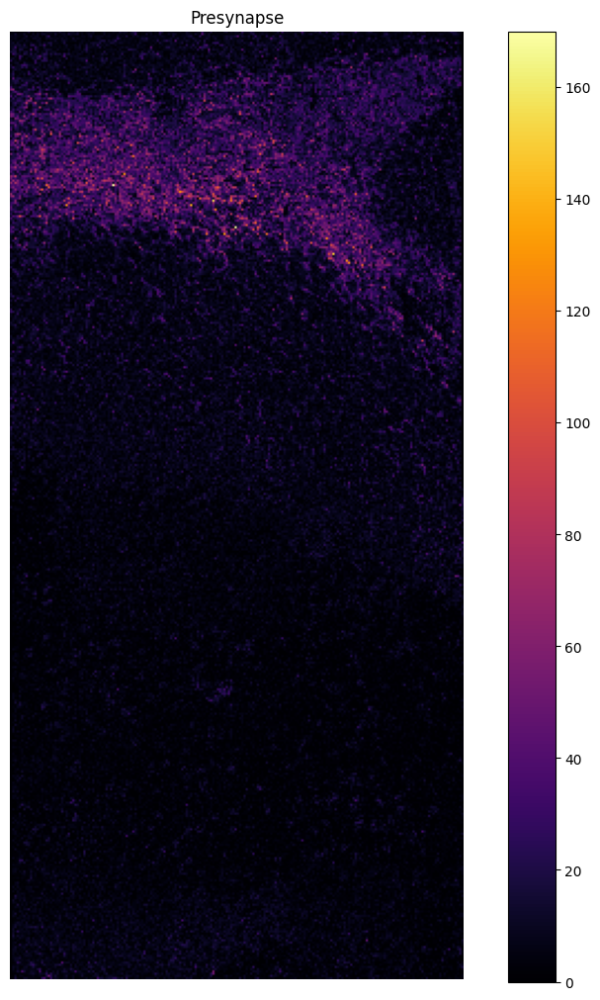

INFO     Rasterizing image for faster rendering.                                                                   


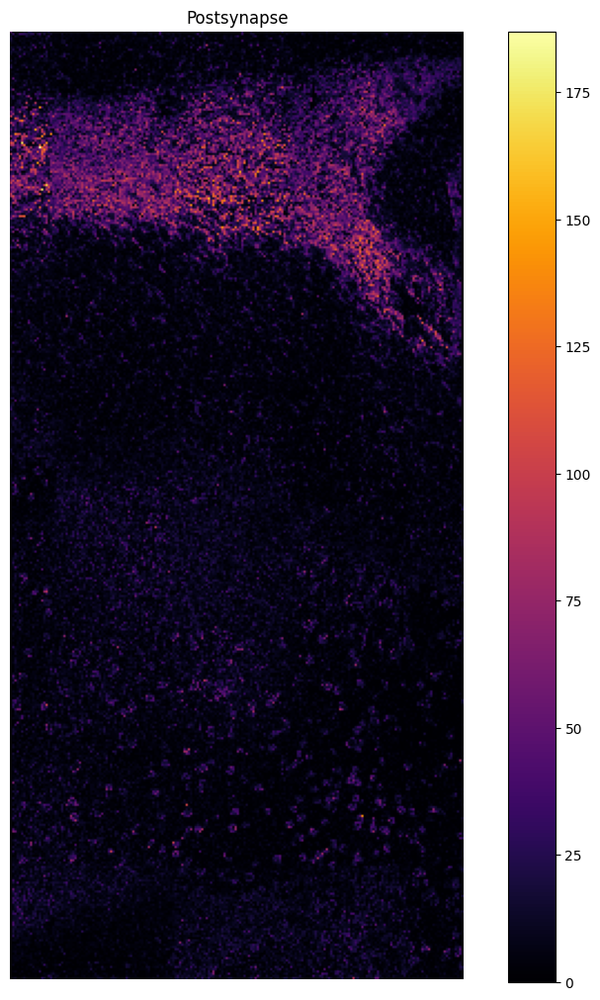

In [4]:
# Visualize the raw presynaptic and postsynaptic images to inspect quality.
plot_image(sdata, "pre_if", title="Presynapse")
plot_image(sdata, "post_if", title="Postsynapse")

INFO     Rasterizing image for faster rendering.                                                                   


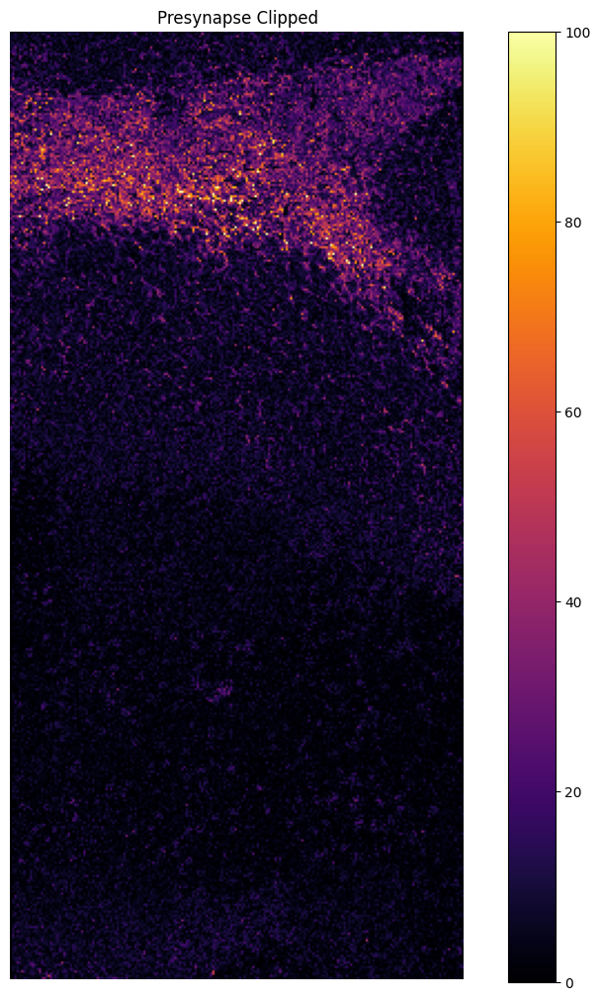

In [5]:
# Clipping presynapse raw image
sdata["pre_if_clipped"] = sd.models.Image2DModel.parse(
    sdata["pre_if"].compute().clip(min=0, max=100)
)
plot_image(sdata, "pre_if_clipped", title="Presynapse Clipped")

INFO     Rasterizing image for faster rendering.                                                                   


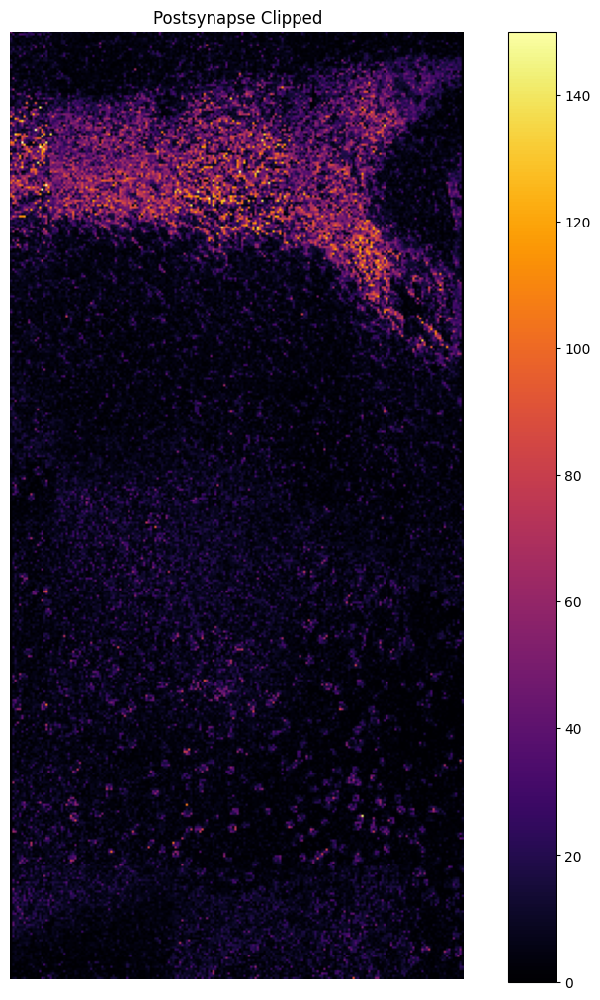

In [6]:
# Clipping postsynapse raw image
sdata["post_if_clipped"] = sd.models.Image2DModel.parse(
    sdata["post_if"].compute().clip(min=0, max=150)
)
plot_image(sdata, "post_if_clipped", title="Postsynapse Clipped")

## 4. Segment Synapses

We segment the synapses using preprocessing steps that include gamma adjustment, Gaussian filtering, and erosion. Then we apply multi-Otsu thresholding to classify image regions into distinct classes.  
- **Preprocessing:** Gamma correction and Gaussian smoothing reduce noise.  
- **Morphological Erosion:** Helps to remove small artifacts.  
- **Thresholding:** Multi-Otsu thresholding separates the image into multiple regions.

In [7]:
# For presynaptic segmentation.
def segment_presynapse(chunk):
    img = adjust_gamma(chunk, gamma=0.95)  # Adjust gamma for brightness.
    img = gaussian(img, sigma=5)  # Smooth image.
    kernel = np.ones((5, 5), np.uint8)
    img = cv2.erode(img, kernel, iterations=5)  # Erode to remove small artifacts.
    thresholds = list(threshold_multiotsu(img, classes=3))
    regions = np.digitize(img, bins=thresholds)
    return regions


depth = 250
presynapse_input = sdata["pre_if_clipped"].sel(c=0)  # Use the clipped image
presynapse_shapes = sd.map_raster(
    presynapse_input, segment_presynapse, depth=depth, trim=True, meta=np.array(())
)
presynapse_shapes = presynapse_shapes.compute()
sdata["presynapse_multiotsu"] = sd.models.Image2DModel.parse(
    presynapse_shapes.expand_dims(dim={"c": 1})
)


# For postsynaptic segmentation.
def segment_postsynapse(chunk):
    img = adjust_gamma(chunk, gamma=1.0)
    img = gaussian(img, sigma=5)
    kernel = np.ones((5, 5), np.uint8)
    img = cv2.erode(img, kernel, iterations=5)
    thresholds = list(threshold_multiotsu(img, classes=3))
    regions = np.digitize(img, bins=thresholds)
    return regions


postsynapse_input = sdata["post_if_clipped"].sel(c=0)  # Use the clipped image
postsynapse_shapes = sd.map_raster(
    postsynapse_input, segment_postsynapse, depth=depth, trim=True, meta=np.array(())
)
postsynapse_shapes = postsynapse_shapes.compute()
sdata["postsynapse_multiotsu"] = sd.models.Image2DModel.parse(
    postsynapse_shapes.expand_dims(dim={"c": 1})
)

## 5. Visualize Segmentation Results

Here we visualize the segmentation outputs for both the presynaptic and postsynaptic IF images using a blue colormap.


INFO     Rasterizing image for faster rendering.                                                                   


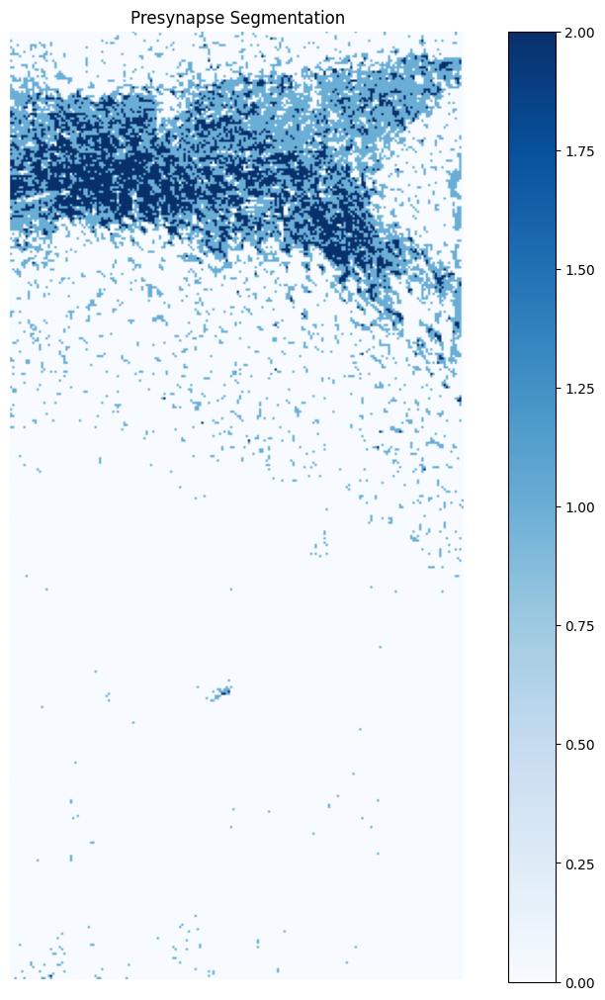

INFO     Rasterizing image for faster rendering.                                                                   


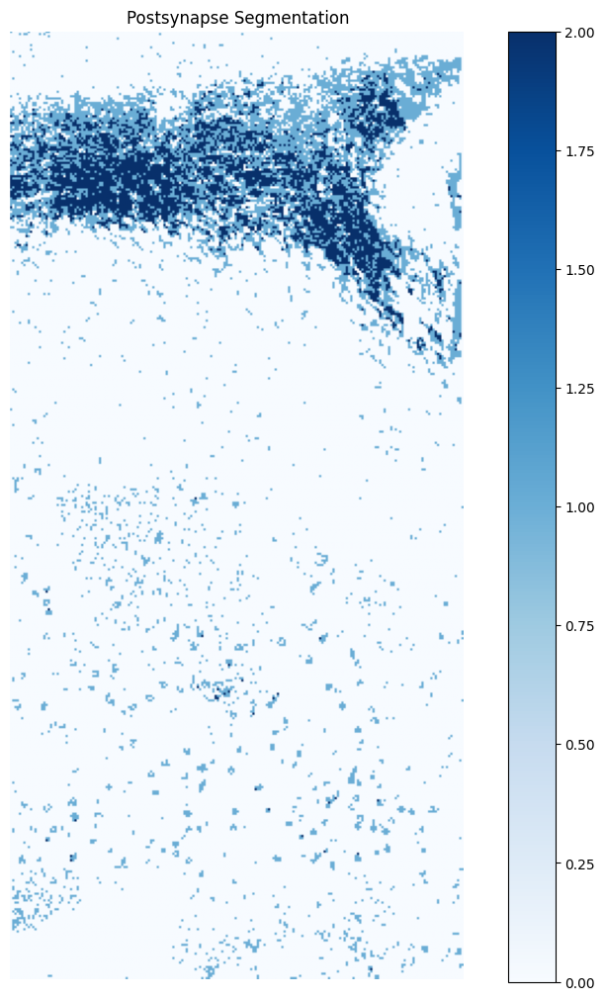

In [8]:
# Plot the segmentation outputs using a blue colormap.
plot_image(sdata, "presynapse_multiotsu", cmap="Blues", title="Presynapse Segmentation")
plot_image(
    sdata, "postsynapse_multiotsu", cmap="Blues", title="Postsynapse Segmentation"
)

## 6. Save Segmentation as Label Elements

We convert the segmentation masks into label elements for further analysis. The transformation matrix is obtained from the presynaptic segmentation, and it is applied to both presynaptic and postsynaptic labels.

In [9]:
# Convert segmentation masks into label elements using an affine transformation.
synapse_trans = get_transformation(sdata["presynapse_multiotsu"], get_all=True)[
    "global"
]
transformation = {"global": synapse_trans.to_affine(("y", "x"), ("x", "y"))}

sdata["presynapse_label"] = sd.models.Labels2DModel.parse(
    (
        (sdata["presynapse_multiotsu"] == 2) | (sdata["presynapse_multiotsu"] == 1)
    ).astype(int)[0],
    transformations=transformation,
)
sdata["postsynapse_label"] = sd.models.Labels2DModel.parse(
    (
        (sdata["postsynapse_multiotsu"] == 2) | (sdata["postsynapse_multiotsu"] == 1)
    ).astype(int)[0],
    transformations=transformation,
)
sdata["transcripts"] = sdata["transcripts"].reset_index(drop=True)

/home/ckmah/mambaforge/envs/synapse/lib/python3.11/site-packages/spatialdata/_core/_elements.py:106: UserWarning: Key `transcripts` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)


## 7. Extract the Coordinates of Synaptic Pixels

This section extracts the coordinates of pixels that correspond to true synaptic signals from both presynaptic and postsynaptic label images. The coordinates are transformed using the affine transformation for consistency.


In [10]:
# Extract pixel coordinates with a value of 1 from label images and transform them for spatial consistency.
def label_transformation(element, input_axes, output_axes):
    trans = get_transformation(element, get_all=True)["global"]
    affine_trans = trans.to_affine_matrix(
        input_axes=input_axes, output_axes=output_axes
    )
    trans = mtransforms.Affine2D(matrix=affine_trans).inverted()
    return trans


presynapse_element = sdata["presynapse_label"]
postsynapse_element = sdata["postsynapse_label"]
input_axes = ("y", "x")
output_axes = ("x", "y")
label_trans = label_transformation(presynapse_element, input_axes, output_axes)

# Get coordinates where labels are 1.
presynapse_coordinates_temp = set(zip(*np.where(presynapse_element.values == 1)))
postsynapse_coordinates_temp = set(zip(*np.where(postsynapse_element.values == 1)))

# Separate exclusive and overlapping coordinates.
presynapse_coordinates = presynapse_coordinates_temp.difference(
    postsynapse_coordinates_temp
)
postsynapse_coordinates = postsynapse_coordinates_temp.difference(
    presynapse_coordinates_temp
)
pre_and_post_coordinates = presynapse_coordinates_temp.intersection(
    postsynapse_coordinates_temp
)

## 8. Map Points Excluding Transcripts in Soma

In this section, we focus on mapping transcript points that are not associated with any soma (i.e., those with a `cell_id` of "UNASSIGNED") to the synaptic compartments. This process involves several detailed steps:

1. **Filtering Unassigned Transcripts:**  
   - We first extract transcript points that are unassigned to any soma by filtering the transcript dataset based on the `cell_id`.  
   - Only transcripts with `cell_id` equal to "UNASSIGNED" are retained, ensuring that we focus solely on those that are presumed to belong to synaptic regions rather than being soma-specific.

2. **Coordinate Transformation:**  
   - The raw coordinates of these unassigned transcript points are transformed using a precomputed affine transformation.  
   - This transformation corrects for differences in scale and orientation between the original imaging data and the segmentation masks, ensuring that the transcript positions align accurately with the tissue’s spatial framework.

3. **Mapping to Synaptic Compartments:**  
   - With transformed coordinates, each transcript point is then compared against the binary masks that define the presynaptic, postsynaptic, and overlapping (pre-and-post) regions.  
   - **Presynaptic Mapping:** Transcripts that fall within the presynaptic mask are flagged as presynaptic.  
   - **Postsynaptic Mapping:** Transcripts that fall within the postsynaptic mask are flagged as postsynaptic.  
   - **Ambiguous (Pre and Post):** Transcripts located in regions where the presynaptic and postsynaptic masks overlap are considered ambiguous, as it is unclear which compartment they belong to.

4. **Boolean Classification:**  
   - Boolean flags (True/False) are assigned to each transcript point based on whether they match the conditions for presynaptic, postsynaptic, or overlapping compartments.  
   - This classification is then stored in new columns within the transcript dataset, setting the stage for downstream quantitative analyses.

By carefully filtering, transforming, and mapping these unassigned transcript points, we isolate the synaptic-specific signals. This ensures that further analyses—such as counting transcripts in each synaptic compartment—accurately reflect the spatial organization of gene expression in the tissue.

In [11]:
# Map transcript points not associated with any soma (cell_id "UNASSIGNED") to synaptic compartments.
points_df = sdata["transcripts"].compute()
# Transform raw coordinates using the affine transformation.
points_df["coordinate_transformed"] = (
    np.floor(
        label_trans.transform(
            np.column_stack((points_df["x"] * 4.70588235, points_df["y"] * 4.70588235))
        )
    ).astype(int)
).tolist()
points_df = points_df.loc[points_df["cell_id"] == "UNASSIGNED"]


def process_points(row, binary_coordinates):
    return tuple(row["coordinate_transformed"]) in binary_coordinates


# Apply mapping for presynaptic, postsynaptic, and overlapping compartments.
presynapse_process = partial(process_points, binary_coordinates=presynapse_coordinates)
postsynapse_process = partial(
    process_points, binary_coordinates=postsynapse_coordinates
)
pre_and_post_process = partial(
    process_points, binary_coordinates=pre_and_post_coordinates
)

points_df["presynapse"] = points_df.apply(presynapse_process, axis=1)
points_df["postsynapse"] = points_df.apply(postsynapse_process, axis=1)
points_df["pre_and_post"] = points_df.apply(pre_and_post_process, axis=1)

In [12]:
# Save mapped points for each synaptic compartment.
sdata["presynapse_points"] = sd.models.PointsModel.parse(
    points_df.loc[points_df["presynapse"] == True]
)
sdata["presynapse_points"].attrs = sdata["transcripts"].attrs

sdata["postsynapse_points"] = sd.models.PointsModel.parse(
    points_df.loc[points_df["postsynapse"] == True]
)
sdata["postsynapse_points"].attrs = sdata["transcripts"].attrs

sdata["pre_and_post_points"] = sd.models.PointsModel.parse(
    points_df.loc[points_df["pre_and_post"] == True]
)
sdata["pre_and_post_points"].attrs = sdata["transcripts"].attrs


## 9. Map Points Including Transcripts in Soma

In this section, we re-map the transcript points—including those associated with soma to accurately align them with the spatial framework used in our analysis. The steps involved are as follows:

1. **Comprehensive Mapping:**  
   We process the entire transcript dataset (including soma-associated points) rather than filtering them out. This ensures that all transcripts are considered for downstream analyses, enabling comparisons between soma and synaptic compartments.

2. **Coordinate Transformation:**  
   Using the previously computed affine transformation, we adjust the raw transcript coordinates. This transformation accounts for scaling and orientation differences between the original imaging data and the segmentation outputs, ensuring that the spatial positions of transcripts are correctly aligned with the tissue architecture.

3. **Consistency with Previous Processing:**  
   The same transformation and processing pipeline applied to the unassigned transcripts (i.e., those not mapped to somas) is reused here. This consistency is critical for enabling a direct comparison between transcripts mapped to synaptic compartments and those associated with soma.

4. **Preparation for Further Analysis:**  
   The remapped transcript points are used to classify transcripts into different compartments based on spatial overlap with the segmentation masks. This enriched dataset supports further analyses, such as overlaying transcript distributions on the integrated segmentation and nucleus plots, and quantifying gene expression patterns in the context of somatic and synaptic structures.

Overall, this section ensures that transcript data from both soma and synaptic regions are accurately mapped and integrated, providing a solid foundation for subsequent spatial and quantitative analyses.


In [13]:
# Re-map all transcript points (including soma-associated) using the same transformation.
points_df = sdata["transcripts"].compute()
points_df["coordinate_transformed"] = (
    np.floor(
        label_trans.transform(
            np.column_stack((points_df["x"] * 4.70588235, points_df["y"] * 4.70588235))
        )
    ).astype(int)
).tolist()


# Process all transcripts (no filtering by cell_id) to enable comparisons.
def process_points(row, binary_coordinates):
    return tuple(row["coordinate_transformed"]) in binary_coordinates


presynapse_process = partial(process_points, binary_coordinates=presynapse_coordinates)
postsynapse_process = partial(
    process_points, binary_coordinates=postsynapse_coordinates
)
pre_and_post_process = partial(
    process_points, binary_coordinates=pre_and_post_coordinates
)

points_df["presynapse_all"] = points_df.apply(presynapse_process, axis=1)
points_df["postsynapse_all"] = points_df.apply(postsynapse_process, axis=1)
points_df["pre_and_post_all"] = points_df.apply(pre_and_post_process, axis=1)

In [14]:
# Save the re-mapped points including soma-associated transcripts.
sdata["presynapse_points_all"] = sd.models.PointsModel.parse(
    points_df.loc[points_df["presynapse_all"] == True]
)
sdata["presynapse_points_all"].attrs = sdata["transcripts"].attrs

sdata["postsynapse_points_all"] = sd.models.PointsModel.parse(
    points_df.loc[points_df["postsynapse_all"] == True]
)
sdata["postsynapse_points_all"].attrs = sdata["transcripts"].attrs

sdata["pre_and_post_points_all"] = sd.models.PointsModel.parse(
    points_df.loc[points_df["pre_and_post_all"] == True]
)
sdata["pre_and_post_points_all"].attrs = sdata["transcripts"].attrs


## 10. Plot Synaptic Points

We visualize the transcript points mapped to each synaptic compartment (pre, post, and overlapping) to assess their spatial distribution.


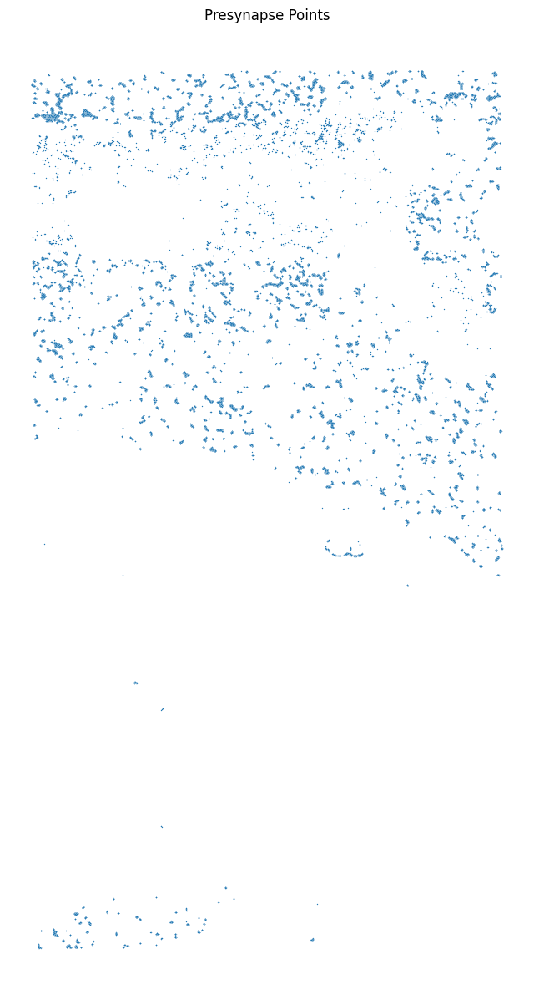

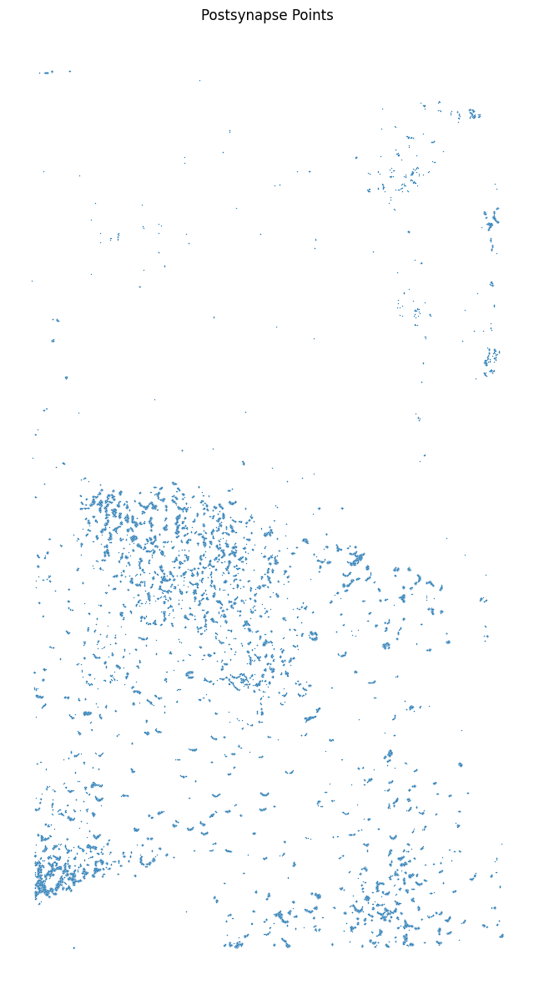

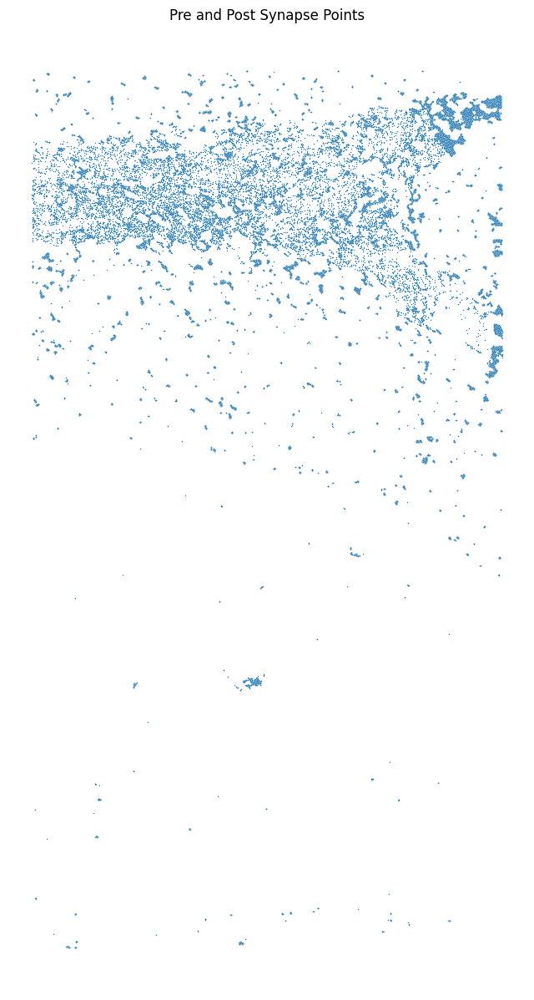

In [15]:
# Plot the transcript points mapped to each synaptic compartment.
presynapse_points = plot_points(
    sdata, "presynapse_points", title="Presynapse Points", figsize=(8, 15)
)
postsynapse_points = plot_points(
    sdata, "postsynapse_points", title="Postsynapse Points", figsize=(8, 15)
)
pre_and_post_points = plot_points(
    sdata, "pre_and_post_points", title="Pre and Post Synapse Points", figsize=(8, 15)
)

## 11. Calculate Counts

Below is a summary of the compartments and filtering logic applied to derive transcript counts. The compartments are explained and grouped as follows:

### Basic Compartments
- **presynapse:** Transcripts detected exclusively in presynaptic regions.
- **postsynapse:** Transcripts detected exclusively in postsynaptic regions.
- **pre_and_post:** Transcripts detected in regions where presynaptic and postsynaptic signals overlap.
- **nucleus:** Transcripts detected in nuclei.
- **soma:** Transcripts detected in soma.
- **all:** Total transcripts for each gene.

### Soma Counts with Synaptic Exclusions
- **soma_with_presynapse_exclusion:** Soma counts after excluding transcripts from the presynaptic region.
- **soma_with_postsynapse_exclusion:** Soma counts after excluding transcripts from the postsynaptic region.
- **soma_with_presynape_and_postsynapse_exclusion:** Soma counts after excluding transcripts from regions with overlapping pre- and postsynaptic signals.

### Total Counts with Synaptic Exclusions
- **all_with_presynapse_exclusion:** Total counts after excluding presynaptic transcripts.
- **all_with_postsynapse_exclusion:** Total counts after excluding postsynaptic transcripts.
- **all_with_presynape_and_postsynapse_exclusion:** Total counts after excluding transcripts from overlapping pre- and postsynaptic regions.

### Additional Exclusion Groups
- **all_with_nucleus_exclusion:** Total counts after subtracting transcripts overlapping nuclei.
- **all_with_soma_excusion:** Total counts in the area excluding soma-associated transcripts.


In [16]:
# --- Basic Compartments ---
# Count transcripts (by gene) from synaptic points.
presynapse_compartment = presynapse_points["feature_name"].value_counts()
postsynapse_compartment = postsynapse_points["feature_name"].value_counts()
pre_and_post_compartment = pre_and_post_points["feature_name"].value_counts()

# --- Compute Overall Transcript Data and Group by Soma ---
# Load full transcript data and flag those within soma (cell_id != "UNASSIGNED").
transcripts = sdata["transcripts"].compute()[
    ["x", "y", "feature_name", "cell_id", "overlaps_nucleus", "qv", "is_gene"]
]
transcripts["overlaps_soma"] = transcripts["cell_id"] != "UNASSIGNED"

# Group transcripts by soma (overlaps_soma) and gene.
soma_df = (
    transcripts.groupby(["overlaps_soma", "feature_name"])
    .size()
    .unstack(fill_value=0)
    .T
)
soma_df.columns = ["all_with_soma_excusion", "soma"]
soma_compartment = soma_df["soma"]
all_with_soma_excusion_compartment = soma_df["all_with_soma_excusion"]

# --- Group Transcripts by Nucleus Overlap ---
# Group transcripts by nucleus overlap to get nuclear counts.
nucleus_df = (
    transcripts.groupby(["overlaps_nucleus", "feature_name"])
    .size()
    .unstack(fill_value=0)
    .T
)
nucleus_df.columns = ["synapse", "nucleus"]
nucleus_compartment = nucleus_df["nucleus"]

# --- Total Counts ---
# Total transcripts across all compartments.
all_compartment = soma_df.sum(axis=1)
# Subtract nuclear counts to get a synapse-focused total.
all_with_nucleus_exclusion_compartment = all_compartment - nucleus_compartment

# --- Exclude Synaptic Transcripts from Soma Counts ---
# Load transcript points mapped to synaptic compartments, then filter out those in soma.
presynapse_points_all = sdata["presynapse_points_all"].compute()
postsynapse_points_all = sdata["postsynapse_points_all"].compute()
pre_and_post_points_all = sdata["pre_and_post_points_all"].compute()
presynapse_points_all = presynapse_points_all.loc[
    presynapse_points_all["cell_id"] != "UNASSIGNED"
]
postsynapse_points_all = postsynapse_points_all.loc[
    postsynapse_points_all["cell_id"] != "UNASSIGNED"
]
pre_and_post_points_all = pre_and_post_points_all.loc[
    pre_and_post_points_all["cell_id"] != "UNASSIGNED"
]

# --- Soma Counts with Synaptic Exclusions ---
soma_with_presynapse_exclusion = (
    soma_compartment - presynapse_points_all["feature_name"].value_counts()
)
soma_with_postsynapse_exclusion = (
    soma_compartment - postsynapse_points_all["feature_name"].value_counts()
)
soma_with_presynape_and_postsynapse_exclusion = (
    soma_compartment - pre_and_post_points_all["feature_name"].value_counts()
)

# --- Total Counts with Synaptic Exclusions ---
all_with_presynapse_exclusion = (
    all_compartment - presynapse_points_all["feature_name"].value_counts()
)
all_with_postsynapse_exclusion = (
    all_compartment - postsynapse_points_all["feature_name"].value_counts()
)
all_with_presynape_and_postsynapse_exclusion = (
    all_compartment - pre_and_post_points_all["feature_name"].value_counts()
)

# --- Create DataFrame with All Counts ---
counts = pd.DataFrame(
    {
        "presynapse": presynapse_compartment,
        "postsynapse": postsynapse_compartment,
        "pre_and_post": pre_and_post_compartment,
        "nucleus": nucleus_compartment,
        "soma": soma_compartment,
        "all": all_compartment,
        "soma_with_presynapse_exclusion": soma_with_presynapse_exclusion,
        "all_with_presynapse_exclusion": all_with_presynapse_exclusion,
        "soma_with_postsynapse_exclusion": soma_with_postsynapse_exclusion,
        "all_with_postsynapse_exclusion": all_with_postsynapse_exclusion,
        "soma_with_presynape_and_postsynapse_exclusion": soma_with_presynape_and_postsynapse_exclusion,
        "all_with_presynape_and_postsynapse_exclusion": all_with_presynape_and_postsynapse_exclusion,
        "all_with_nucleus_exclusion": all_with_nucleus_exclusion_compartment,
        "all_with_soma_excusion": all_with_soma_excusion_compartment,
    }
)
counts  # Display the final counts DataFrame.

/tmp/ipykernel_886123/746998350.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  transcripts.groupby(["overlaps_soma", "feature_name"])
/tmp/ipykernel_886123/746998350.py:28: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  transcripts.groupby(["overlaps_nucleus", "feature_name"])


,presynapse,postsynapse,pre_and_post,nucleus,soma,all,soma_with_presynapse_exclusion,all_with_presynapse_exclusion,soma_with_postsynapse_exclusion,all_with_postsynapse_exclusion,soma_with_presynape_and_postsynapse_exclusion,all_with_presynape_and_postsynapse_exclusion,all_with_nucleus_exclusion,all_with_soma_excusion
feature_name,,,,,,,,,,,,,,
A1cf,1,0,0,21,33,41,33,41,32,40,30,38,20,8
A2m,16,53,29,1908,3254,5264,3185,5195,3150,5160,3118,5128,3356,2010
Aatf,19,6,14,1224,1837,2191,1748,2102,1789,2143,1765,2119,967,354
Abca1,9,6,9,829,1278,1613,1199,1534,1261,1596,1173,1508,784,335
Abca13,0,0,2,17,28,35,24,31,27,34,24,31,18,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Zswim9,5,1,3,188,320,406,296,382,306,392,309,395,218,86
Zup1,7,2,13,464,694,811,646,763,675,792,656,773,347,117
Zyx,26,6,13,1794,2897,3469,2752,3324,2841,3413,2781,3353,1675,572


## 12. Save Counts

The calculated counts are saved as a CSV file for downstream analysis.


In [17]:
# Save the counts DataFrame as a CSV file.
counts.to_csv("/mnt/d/synapse/if_analysis/counts/sagittal1_cerebellum_counts.csv")

## 13. Calculate Pixel Counts

We calculate the number of pixels in the presynaptic, postsynaptic, and pre/post synaptic segmentation masks. We also calculate them with synaptic pixels that overlap with the somatic compartment (ambiguous).


In [18]:
# Calculate pixel counts from segmentation masks and subtract ambiguous (overlapping) pixels.
df = np.floor(presynapse_points_all[["x", "y"]]).astype(int)
presynapse_ambiguous_coordinates = set(zip(df["x"], df["y"]))

df = np.floor(postsynapse_points_all[["x", "y"]]).astype(int)
postsynapse_ambiguous_coordinates = set(zip(df["x"], df["y"]))

df = np.floor(pre_and_post_points_all[["x", "y"]]).astype(int)
pre_and_post_ambiguous_coordinates = set(zip(df["x"], df["y"]))

In [19]:
# Print pixel counts for each synaptic compartment.
print("Presynapse Pixel Count: " + str(len(presynapse_coordinates)))
print(
    "Presynapse Minus Ambiguous Pixel Count: "
    + str(len(presynapse_coordinates) - len(presynapse_ambiguous_coordinates))
)
print("Postsynapse Pixel Count: " + str(len(postsynapse_coordinates)))
print(
    "Postsynapse Minus Ambiguous Pixel Count: "
    + str(len(postsynapse_coordinates) - len(postsynapse_ambiguous_coordinates))
)
print("Pre and Post Pixel Count: " + str(len(pre_and_post_coordinates)))
print(
    "Pre and Post Minus Ambiguous Pixel Count: "
    + str(len(pre_and_post_coordinates) - len(pre_and_post_ambiguous_coordinates))
)


Presynapse Pixel Count: 4174038
Presynapse Minus Ambiguous Pixel Count: 4130749
Postsynapse Pixel Count: 2602668
Postsynapse Minus Ambiguous Pixel Count: 2579424
Pre and Post Pixel Count: 14142314
Pre and Post Minus Ambiguous Pixel Count: 14097957


## 15. Final Plotting

In the final plotting section, we integrate multiple data layers to visualize the synaptic compartments in the context of the tissue architecture. This section performs the following steps:

1. **Segmentation Masks:**
   - The presynaptic and postsynaptic segmentation masks (obtained through preprocessing and multi-Otsu thresholding) are combined into a single RGB image.
   - This combined image highlights areas with exclusive presynaptic signals, exclusive postsynaptic signals, and regions where both signals overlap.

2. **Nucleus Boundaries:**
   - Nucleus boundaries, extracted from nuclear segmentation, are overlaid onto the combined segmentation image.
   - This overlay helps to provide a structural reference, distinguishing synaptic regions from nuclear regions.

3. **Dlg4 Transcript Points:**
   - Dlg4 is a marker gene of interest, and its transcript points are extracted from the dataset.
   - These points are plotted on top of the segmentation and nucleus layers, showing their spatial distribution relative to the synaptic compartments.

4. **Integrated Visualization:**
   - The final composite plot integrates the combined segmentation image, nucleus boundaries, and Dlg4 transcript points.
   - Distinct visual elements (e.g., different marker sizes and colors for transcript points, clear outlines for nucleus boundaries) are used to emphasize the spatial relationships.
   - This integrated view provides a comprehensive representation of how synaptic compartments, cellular structures, and gene expression patterns are organized within the tissue.

Overall, this visualization aids in understanding the molecular architecture of the tissue by displaying the interplay between synaptic signals, nuclear structures, and key gene expression markers.


In [20]:
def show_plot(
    render_obj,
    figsize=(10, 10),
    colorbar=False,
    axis_off=True,
    title="",
    path="",
    show_scalebar=True,
    color="white",
    scalebar_length_microns=100,
    scalebar_bbox_to_anchor=(0.78, -0.13),
    scalebar_bbox_transform=None,
    fontsize=8,
):
    """
    Displays a rendered object with optional title, scale bar, and axis control.

    Parameters:
        render_obj: Object with a `.pl.show()` method for rendering.
        figsize: Tuple specifying the figure size.
        colorbar: Whether to show the colorbar.
        axis_off: Whether to hide the plot axes.
        title: Title of the plot.
        path: File path to save the figure. If empty, the figure is not saved.
        show_scalebar: Whether to add a scale bar to the plot.
        color: Color of the scale bar.
        scalebar_length_microns: Length of the scale bar in microns.
        scalebar_bbox_to_anchor: Anchor point for the scale bar.
        scalebar_bbox_transform: Coordinate system for anchoring the scale bar.
        fontsize: Font size for the scale bar label.
    """
    # Render the base plot from the object.
    render_obj.pl.show(figsize=figsize, colorbar=colorbar)

    # Get current figure and axis for further modifications.
    fig = plt.gcf()
    ax = plt.gca()

    # Add a title if provided.
    plt.title(title)

    # Add a scale bar if requested.
    if show_scalebar:
        scalebar = ScaleBar(
            dx=0.2125,  # Microns per pixel
            units="µm",  # Micron units
            dimension="si-length",  # SI length dimension
            length_fraction=None,  # Use a fixed value
            fixed_value=scalebar_length_microns,
            fixed_units="µm",
            color=color,
            box_color="black",
            box_alpha=0,
            width_fraction=0.007,  # Thin scale bar
            scale_loc="bottom",
            label_loc="top",
            bbox_to_anchor=scalebar_bbox_to_anchor,
            bbox_transform=scalebar_bbox_transform,
            font_properties={"size": fontsize},
            location="lower right",
        )
        # Hide the numeric scale label (use only visual bar).
        scalebar.scale_formatter = lambda value, unit: ""
        ax.add_artist(scalebar)
        fig.canvas.draw()

    # Remove axis if specified.
    if axis_off:
        plt.axis("off")

    # Save the plot if a file path is given.
    if path:
        fig.savefig(path, bbox_inches="tight")

    # Display the plot.
    plt.show()


def plot_gene_transcripts(
    gene,
    points,
    ax,
    scatter_sizes=[4],
    colors=["red"],
    scale=4.70588235,
    invert_y=True,
    title="",
):
    """
    Plots Dlg4 transcript points onto an existing axis.

    Parameters:
        points: DataFrame with the transcript points.
        ax: Matplotlib axis to plot on.
        scatter_sizes: List of sizes for the scatter markers.
        colors: List of colors for each scatter plot layer.
        scale: Multiplication factor for the x and y coordinates.
        invert_y: Whether to invert the y-axis.
        title: Title of the plot.
    """
    data = points.loc[points["feature_name"] == gene].copy()
    data["x"] = data["x"] * scale
    data["y"] = data["y"] * scale
    for s, color in zip(scatter_sizes, colors):
        sns.scatterplot(data=data, x="x", y="y", s=s, color=color, ax=ax, zorder=10)
    if invert_y:
        ax.invert_yaxis()
    ax.axis("off")
    plt.title(title)


def combine_segmentation(presynapse, postsynapse, background):
    """
    Combines presynaptic and postsynaptic segmentation masks into one RGB image.

    Parameters:
        presynapse: 2D numpy array of the presynaptic segmentation.
        postsynapse: 2D numpy array of the postsynaptic segmentation.

    Returns:
        combined_rgb: RGB image (uint8 numpy array) with combined segmentation colors.
    """
    # Create boolean masks where nonzero indicates a "true" pixel.
    presynapse_true = presynapse != 0
    postsynapse_true = postsynapse != 0

    if background == "white":
        # Initialize an empty RGB image.
        combined_rgb = np.full(
            (presynapse_true.shape[0], presynapse_true.shape[1], 3), 255, dtype=np.uint8
        )
    elif background == "black":
        # Initialize an empty RGB image with black background.
        combined_rgb = np.zeros(
            (presynapse_true.shape[0], presynapse_true.shape[1], 3), dtype=np.uint8
        )

    def hex_to_rgb8(hex_color):
        rgb = np.array(to_rgb(hex_color))  # to_rgb returns values in [0,1]
        return (rgb * 255).astype(np.uint8)

    # Define colors.
    color_presynapse_only = hex_to_rgb8("#FDB137")
    color_postsynapse_only = hex_to_rgb8("#1AA7EC")
    color_both = hex_to_rgb8("#77DD77")

    # Create masks for the different cases.
    mask_presynapse_only = np.logical_and(
        presynapse_true, np.logical_not(postsynapse_true)
    )
    mask_postsynapse_only = np.logical_and(
        postsynapse_true, np.logical_not(presynapse_true)
    )
    mask_both = np.logical_and(presynapse_true, postsynapse_true)

    # Assign colors based on masks.
    combined_rgb[mask_presynapse_only] = color_presynapse_only
    combined_rgb[mask_postsynapse_only] = color_postsynapse_only
    combined_rgb[mask_both] = color_both

    return combined_rgb


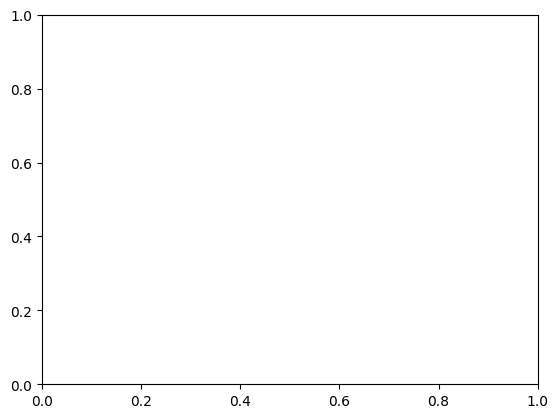

In [21]:
plt_transAxes = plt.gca().transAxes
plt.style.use("dark_background")

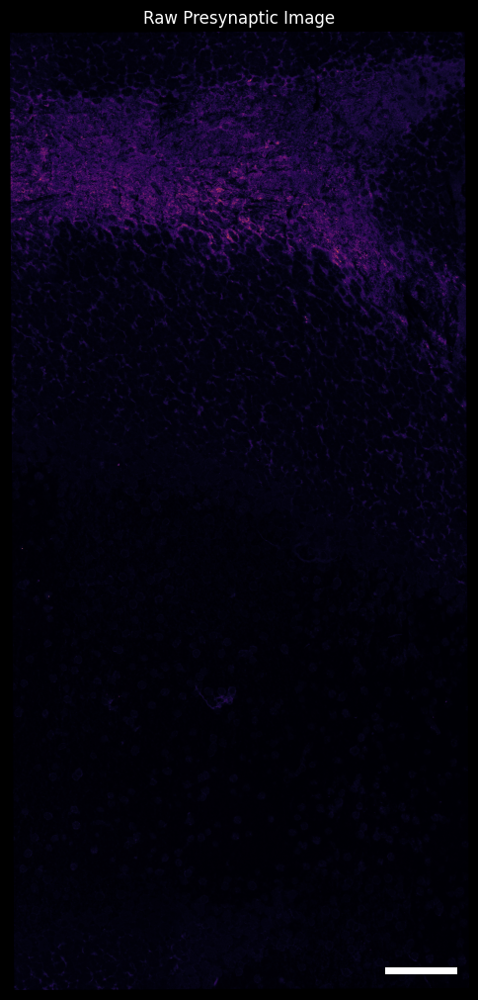

In [22]:
# Raw Presynaptic Image
show_plot(
    sdata.pl.render_images("pre_if", cmap="inferno", scale="full"),
    figsize=(10, 10),
    colorbar=False,
    axis_off=True,
    title="Raw Presynaptic Image",
    scalebar_bbox_transform=plt_transAxes,
)

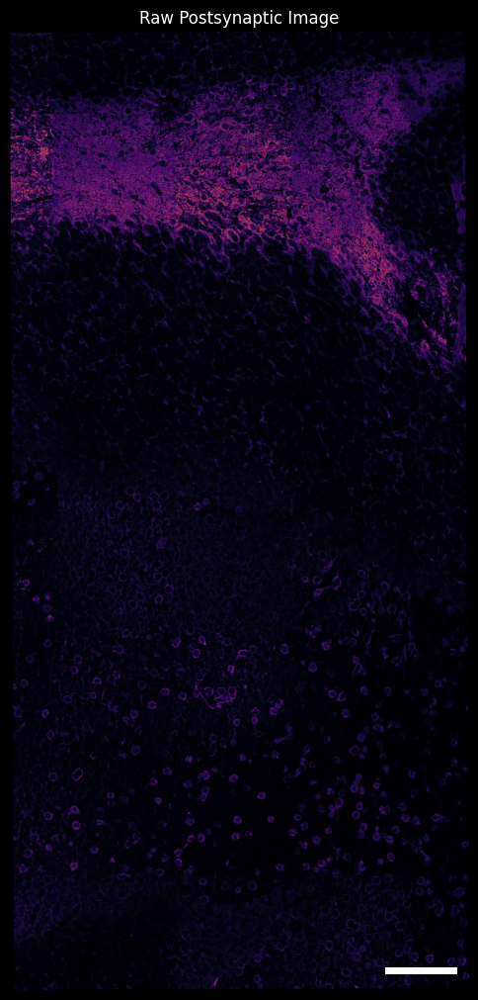

In [23]:
# Raw Postsynaptic Image
show_plot(
    sdata.pl.render_images("post_if", cmap="inferno", scale="full"),
    figsize=(10, 10),
    colorbar=False,
    axis_off=True,
    title="Raw Postsynaptic Image",
    scalebar_bbox_transform=plt_transAxes,
)

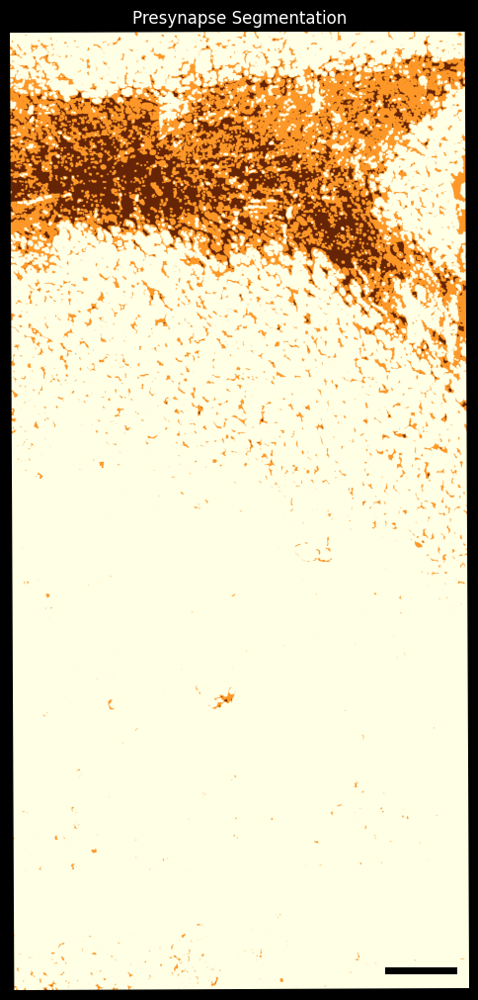

In [24]:
# Presynaptic Segmentation
show_plot(
    sdata.pl.render_images("presynapse_multiotsu", scale="full", cmap="YlOrBr"),
    figsize=(10, 10),
    colorbar=False,
    axis_off=True,
    title="Presynapse Segmentation",
    color="black",
    scalebar_bbox_transform=plt_transAxes,
)

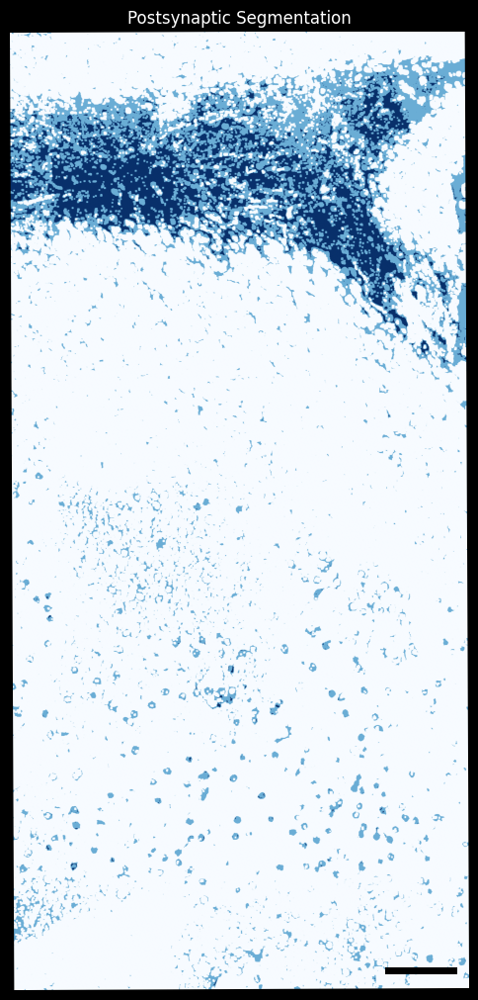

In [25]:
# Postsynaptic Segmentation
show_plot(
    sdata.pl.render_images("postsynapse_multiotsu", scale="full", cmap="Blues"),
    figsize=(10, 10),
    colorbar=False,
    axis_off=True,
    title="Postsynaptic Segmentation",
    color="black",
    scalebar_bbox_transform=plt_transAxes,
)

INFO     no axes information specified in the object, setting `dims` to: ('c', 'y', 'x')                           


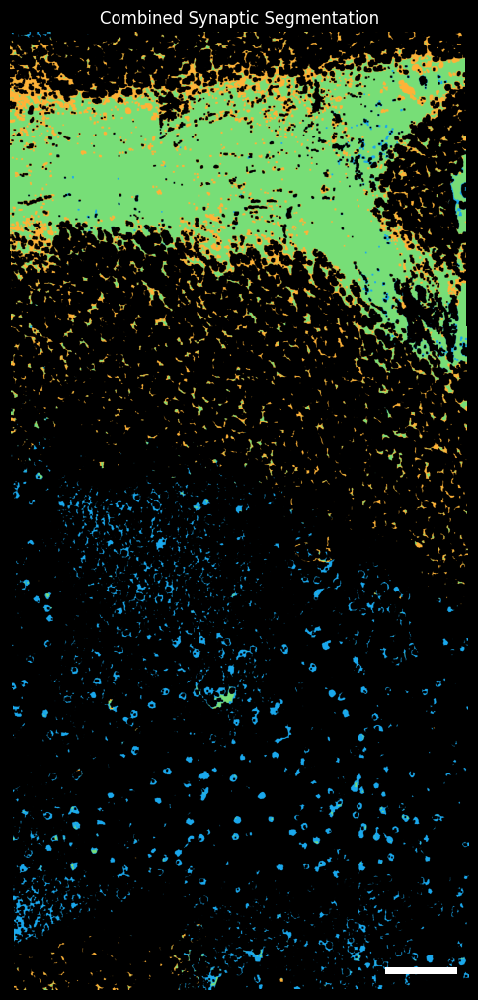

In [26]:
# Load segmentation images (ensure these arrays have the same shape)
presynapse = sdata["presynapse_multiotsu"].compute().values[0]
postsynapse = sdata["postsynapse_multiotsu"].compute().values[0]

# Combine the segmentation masks
combined_rgb = combine_segmentation(presynapse, postsynapse, background="black")

# Optionally, store the combined image in sdata:
combined_rgb_transposed = np.transpose(combined_rgb, (2, 0, 1))
sdata["combined_if_black"] = sd.models.Image2DModel.parse(combined_rgb_transposed)
sdata["combined_if_black"].attrs = sdata["presynapse_multiotsu"].attrs

# Combined Synaptic Segmentation
show_plot(
    sdata.pl.render_images("combined_if_black", scale="full"),
    figsize=(10, 10),
    colorbar=False,
    axis_off=True,
    title="Combined Synaptic Segmentation",
    color="white",
    scalebar_bbox_transform=plt_transAxes,
)

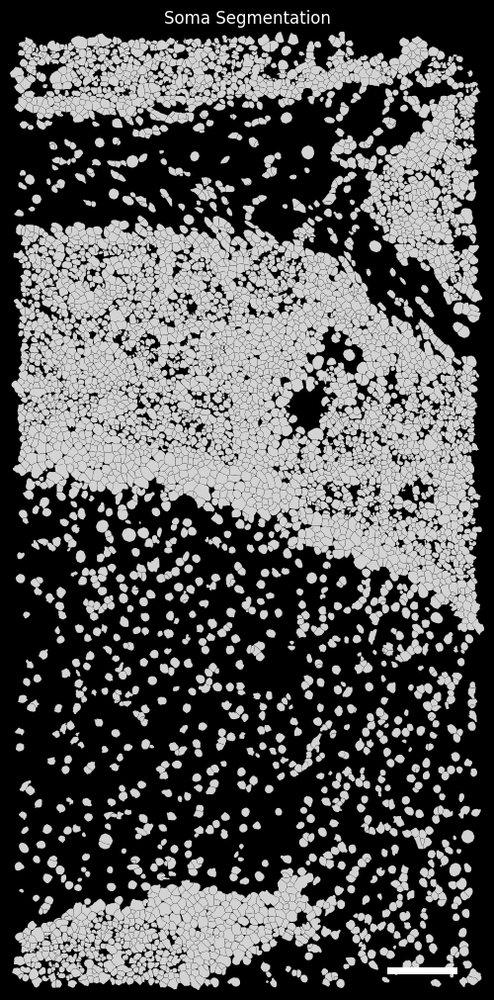

In [27]:
# Soma Segmentation
show_plot(
    sdata.pl.render_shapes("cell_boundaries", fill_alpha=1),
    figsize=(10, 10),
    colorbar=False,
    axis_off=True,
    title="Soma Segmentation",
    color="white",
    scalebar_bbox_transform=plt_transAxes,
    scalebar_bbox_to_anchor=(0.78, -0.13),
)

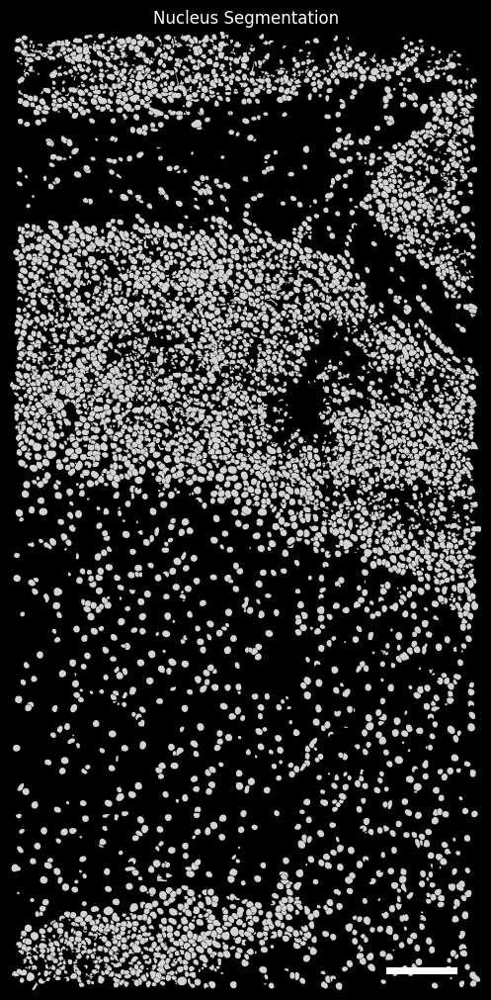

In [28]:
# Nucleus Segmentation
show_plot(
    sdata.pl.render_shapes("nucleus_boundaries", fill_alpha=1),
    figsize=(10, 10),
    colorbar=False,
    axis_off=True,
    title="Nucleus Segmentation",
    color="white",
    scalebar_bbox_transform=plt_transAxes,
    scalebar_bbox_to_anchor=(0.78, -0.13),
)

/home/ckmah/mambaforge/envs/synapse/lib/python3.11/site-packages/matplotlib_scalebar/scalebar.py:457: UserWarning: Drawing scalebar on axes with unequal aspect ratio; either call ax.set_aspect(1) or suppress the warning with rotation='horizontal-only'.
  warnings.warn(


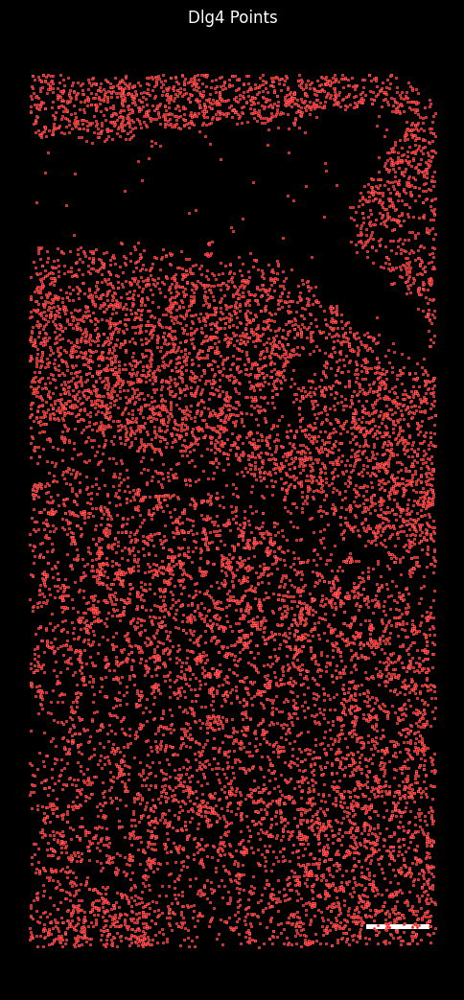

In [29]:
# Dlg4 Points Plot
gene = "Dlg4"
points = sdata["transcripts"].compute()

fig, ax = plt.subplots(figsize=(6, 13))
plot_gene_transcripts(
    gene,
    points,
    ax,
    scatter_sizes=[4],
    colors=["red"],
    scale=4.70588235,
    invert_y=True,
    title="",
)

scalebar = ScaleBar(
    dx=0.2125,  # 0.2125 microns per pixel
    units="µm",  # Micron units
    dimension="si-length",  # SI length dimension
    length_fraction=None,  # Use fixed value instead of fraction
    fixed_value=100,
    fixed_units="µm",
    color="white",
    box_color="black",
    box_alpha=0,
    width_fraction=0.005,  # Thinner bar
    scale_loc="bottom",  # Position of the scale text relative to the bar
    label_loc="top",
    bbox_to_anchor=(0.75, 0),
    bbox_transform=plt_transAxes,
    font_properties={"size": 8},
    location="lower right",  # Location of the scale bar
)
scalebar.scale_formatter = lambda value, unit: ""
ax.add_artist(scalebar)
fig.canvas.draw()
plt.title("Dlg4 Points")
plt.show()

INFO     Value for parameter 'color' appears to be a color, using it as such.                                      


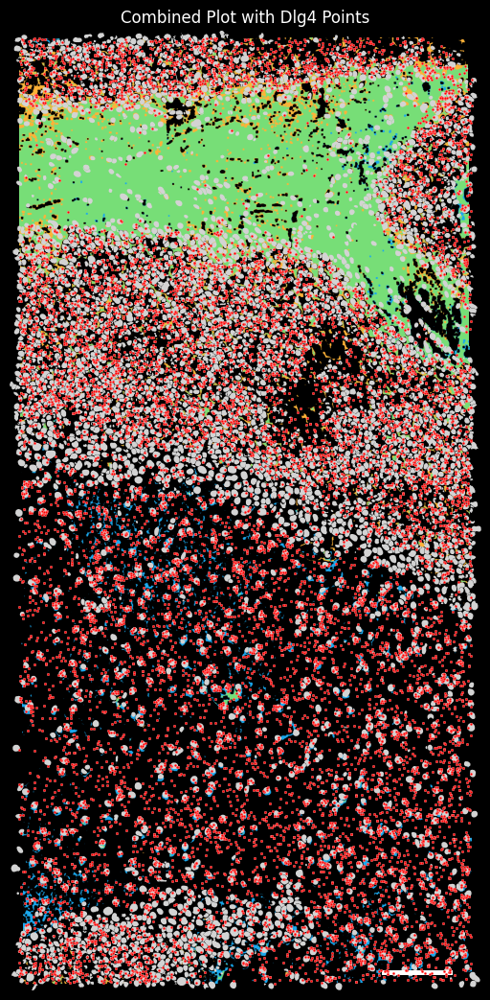

In [30]:
# Combined Plot: Pre and Postsynaptic Segmentation, Nucleus Segmentation, and Dlg4 Points
fig, ax = plt.subplots(figsize=(13, 13))
# Render the combined segmentation image and overlay nucleus boundaries.
sdata.pl.render_images("combined_if_black", scale="full").pl.render_shapes(
    "nucleus_boundaries", fill_alpha=1, color="lightgrey", outline_width=30
).pl.show(colorbar=False, ax=ax)

# Overlay Dlg4 points
plot_gene_transcripts(
    gene,
    points,
    ax,
    scatter_sizes=[4],
    colors=["red"],
    scale=4.70588235,
    invert_y=False,
)
scalebar = ScaleBar(
    dx=0.2125,  # 0.2125 microns per pixel
    units="µm",  # Micron units
    dimension="si-length",  # SI length dimension
    length_fraction=None,  # Use fixed value instead of fraction
    fixed_value=100,
    fixed_units="µm",
    color="white",
    box_color="black",
    box_alpha=0,
    width_fraction=0.005,  # Thinner bar
    scale_loc="bottom",  # Position of the scale text relative to the bar
    label_loc="top",
    bbox_to_anchor=((0.8, -0.13)),
    bbox_transform=plt_transAxes,
    font_properties={"size": 8},
    location="lower right",  # Location of the scale bar
)
scalebar.scale_formatter = lambda value, unit: ""
ax.add_artist(scalebar)
ax.axis("off")
fig.canvas.draw()
plt.title("Combined Plot with Dlg4 Points")
plt.show()

In [31]:
# Crop the spatialdata object using the extent.
sdata_cropped = sd.bounding_box_query(
    sdata,
    axes=("x", "y"),
    min_coordinate=[21500, 10500],
    max_coordinate=[22500, 11500],
    target_coordinate_system="global",
)

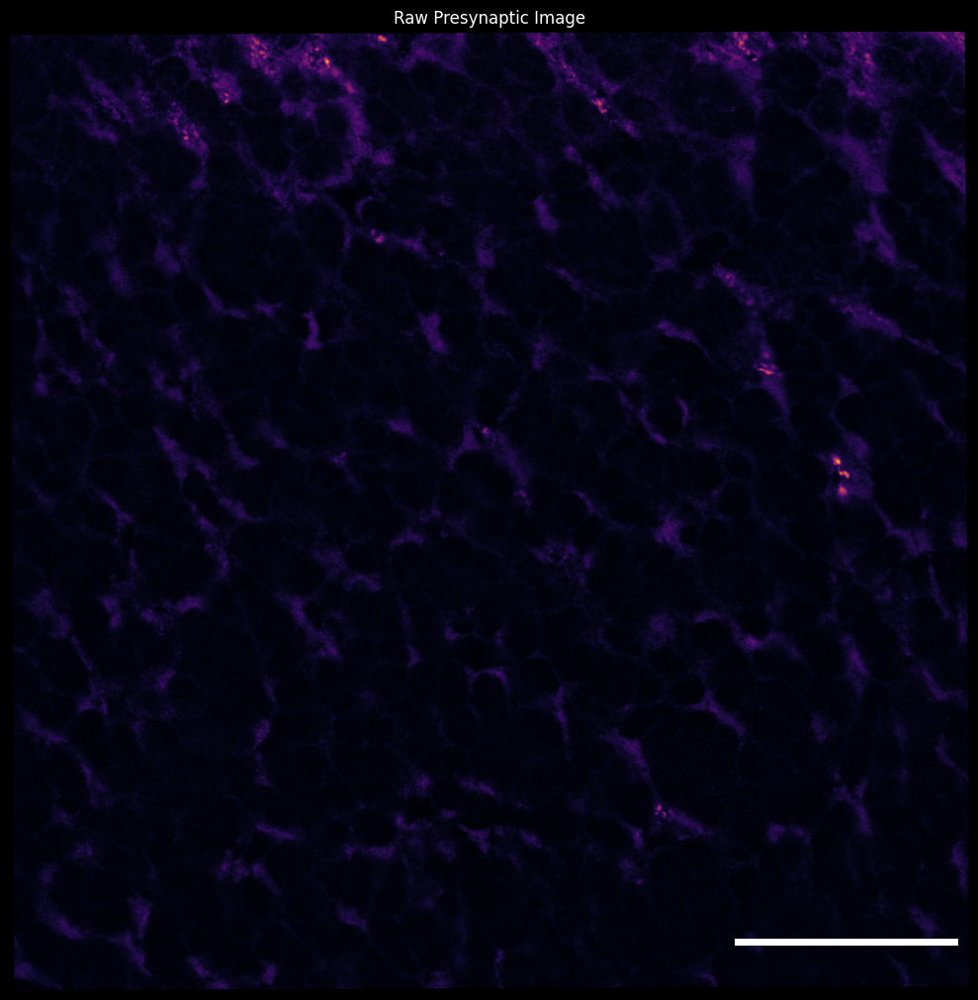

In [32]:
# Raw Presynaptic Image
show_plot(
    sdata_cropped.pl.render_images("pre_if", cmap="inferno", scale="full"),
    figsize=(10, 10),
    colorbar=False,
    axis_off=True,
    title="Raw Presynaptic Image",
    scalebar_bbox_transform=plt_transAxes,
    scalebar_bbox_to_anchor=(1.8, -0.05),
    scalebar_length_microns=50,
)

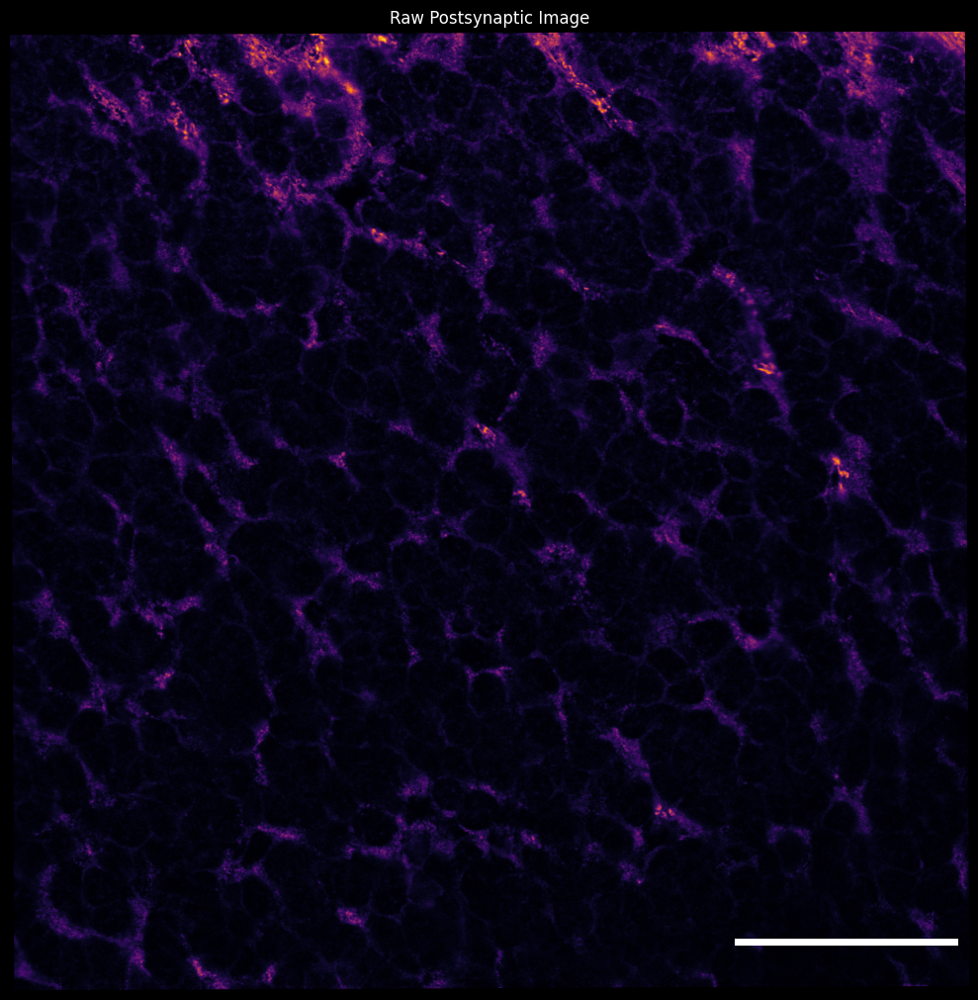

In [33]:
# Raw Postsynaptic Image
show_plot(
    sdata_cropped.pl.render_images("post_if", cmap="inferno", scale="full"),
    figsize=(10, 10),
    colorbar=False,
    axis_off=True,
    title="Raw Postsynaptic Image",
    scalebar_bbox_transform=plt_transAxes,
    scalebar_bbox_to_anchor=(1.8, -0.05),
    scalebar_length_microns=50,
)

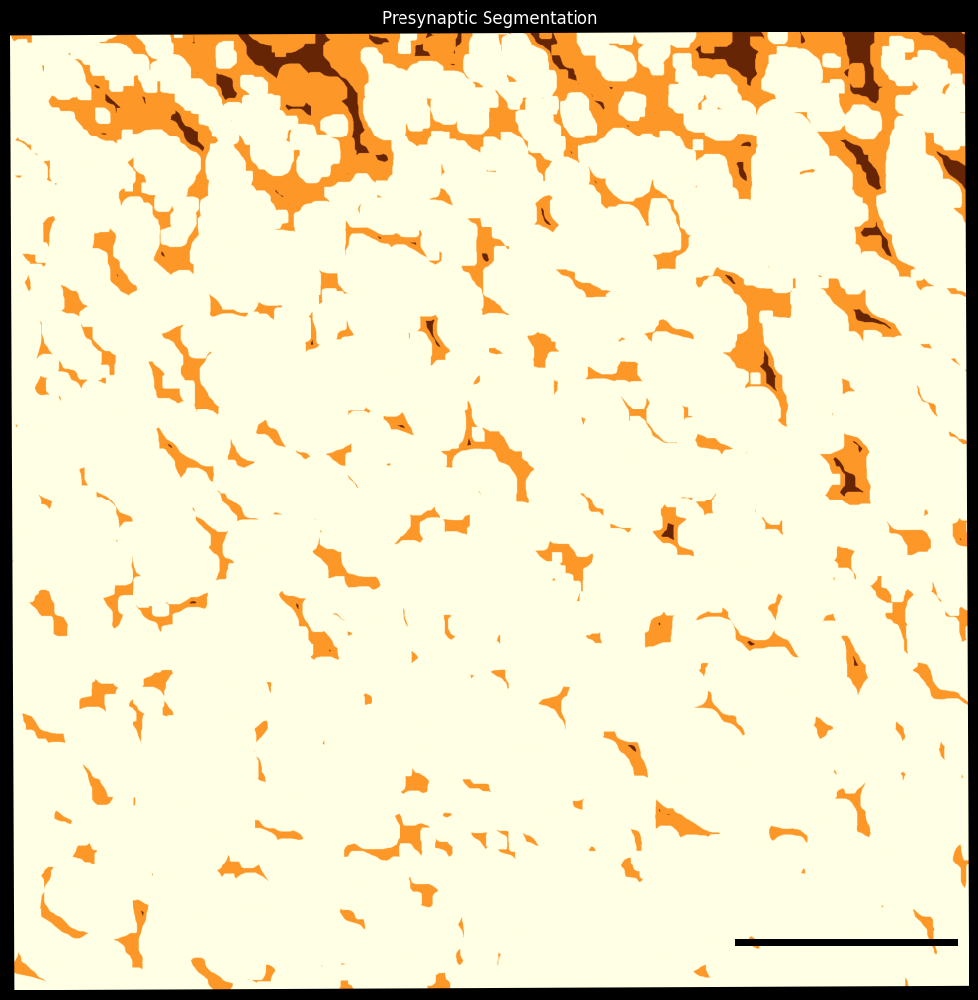

In [34]:
# Presynaptic Segmentation
show_plot(
    sdata_cropped.pl.render_images("presynapse_multiotsu", scale="full", cmap="YlOrBr"),
    figsize=(10, 10),
    colorbar=False,
    axis_off=True,
    title="Presynaptic Segmentation",
    scalebar_bbox_transform=plt_transAxes,
    color="black",
    scalebar_bbox_to_anchor=(1.8, -0.05),
    scalebar_length_microns=50,
)

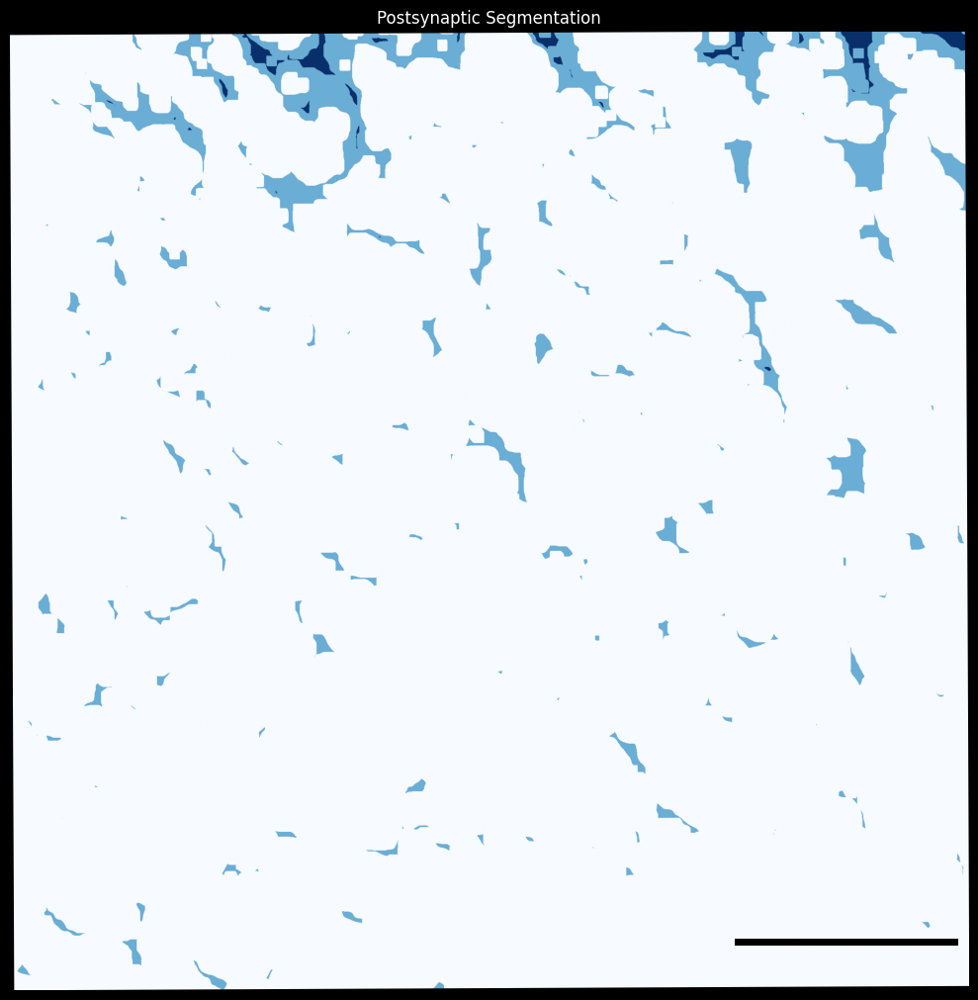

In [35]:
# Postsynaptic Segmentation
show_plot(
    sdata_cropped.pl.render_images("postsynapse_multiotsu", scale="full", cmap="Blues"),
    figsize=(10, 10),
    colorbar=False,
    axis_off=True,
    title="Postsynaptic Segmentation",
    scalebar_bbox_transform=plt_transAxes,
    color="black",
    scalebar_bbox_to_anchor=(1.8, -0.05),
    scalebar_length_microns=50,
)

INFO     no axes information specified in the object, setting `dims` to: ('c', 'y', 'x')                           


/home/ckmah/mambaforge/envs/synapse/lib/python3.11/site-packages/spatialdata/_core/_elements.py:62: UserWarning: Key `combined_if_black` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)


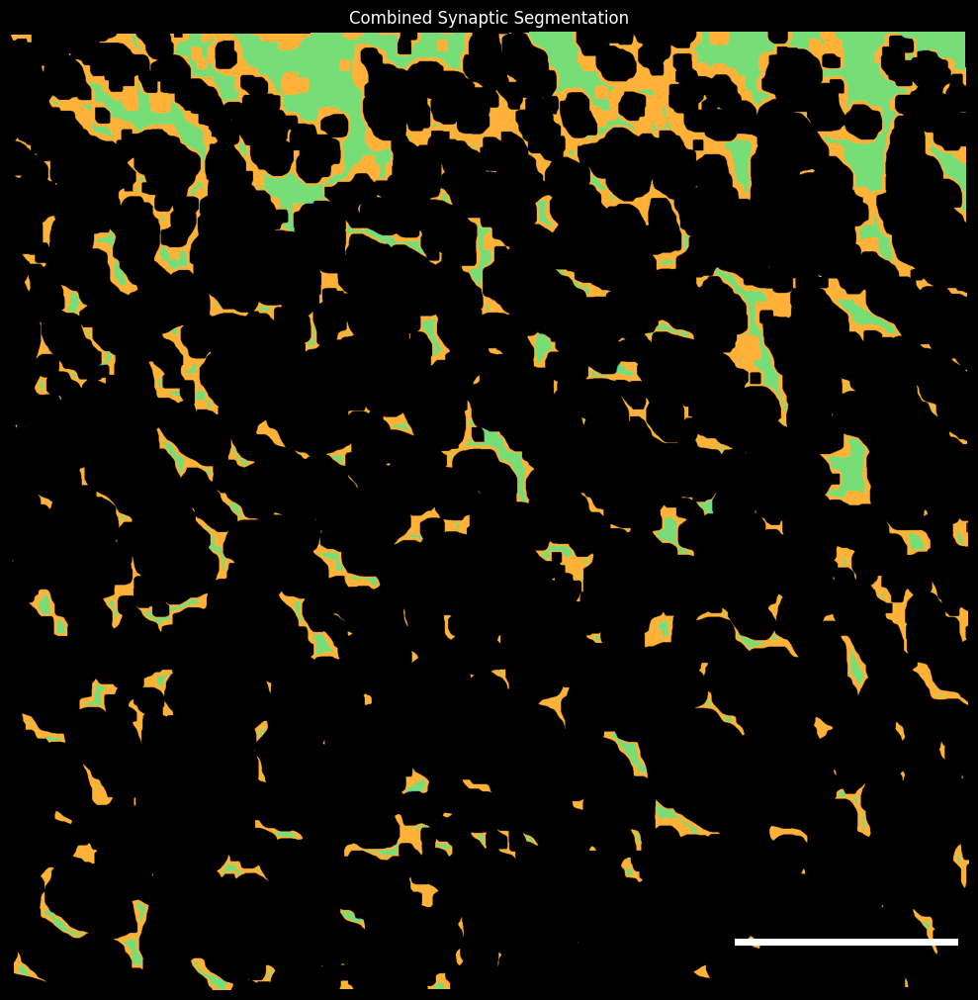

In [36]:
# Load segmentation images (ensure these arrays have the same shape)
presynapse = sdata_cropped["presynapse_multiotsu"].compute().values[0]
postsynapse = sdata_cropped["postsynapse_multiotsu"].compute().values[0]

# Combine the segmentation masks
combined_rgb = combine_segmentation(presynapse, postsynapse, background="black")

# Optionally, store the combined image in sdata:
combined_rgb_transposed = np.transpose(combined_rgb, (2, 0, 1))
sdata_cropped["combined_if_black"] = sd.models.Image2DModel.parse(
    combined_rgb_transposed
)
sdata_cropped["combined_if_black"].attrs = sdata_cropped["presynapse_multiotsu"].attrs

# Combined Synaptic Segmentation
show_plot(
    sdata_cropped.pl.render_images("combined_if_black", scale="full"),
    figsize=(10, 10),
    colorbar=False,
    axis_off=True,
    title="Combined Synaptic Segmentation",
    color="white",
    scalebar_bbox_transform=plt_transAxes,
    scalebar_bbox_to_anchor=(1.8, -0.05),
    scalebar_length_microns=50,
)

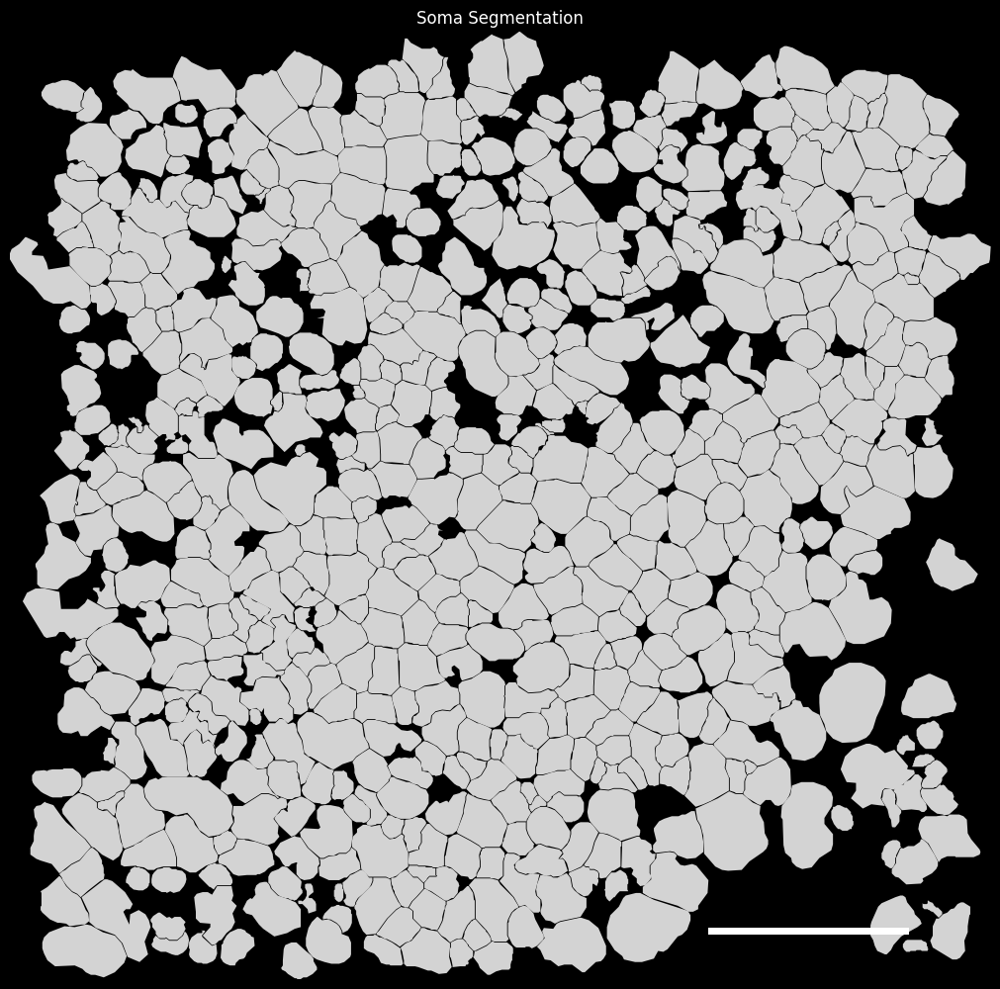

In [37]:
# Soma Segmentation
show_plot(
    sdata_cropped.pl.render_shapes("cell_boundaries", fill_alpha=1),
    figsize=(10, 10),
    colorbar=False,
    axis_off=True,
    title="Soma Segmentation",
    scalebar_bbox_transform=plt_transAxes,
    color="white",
    scalebar_bbox_to_anchor=(1.7, -0.05),
    scalebar_length_microns=50,
)

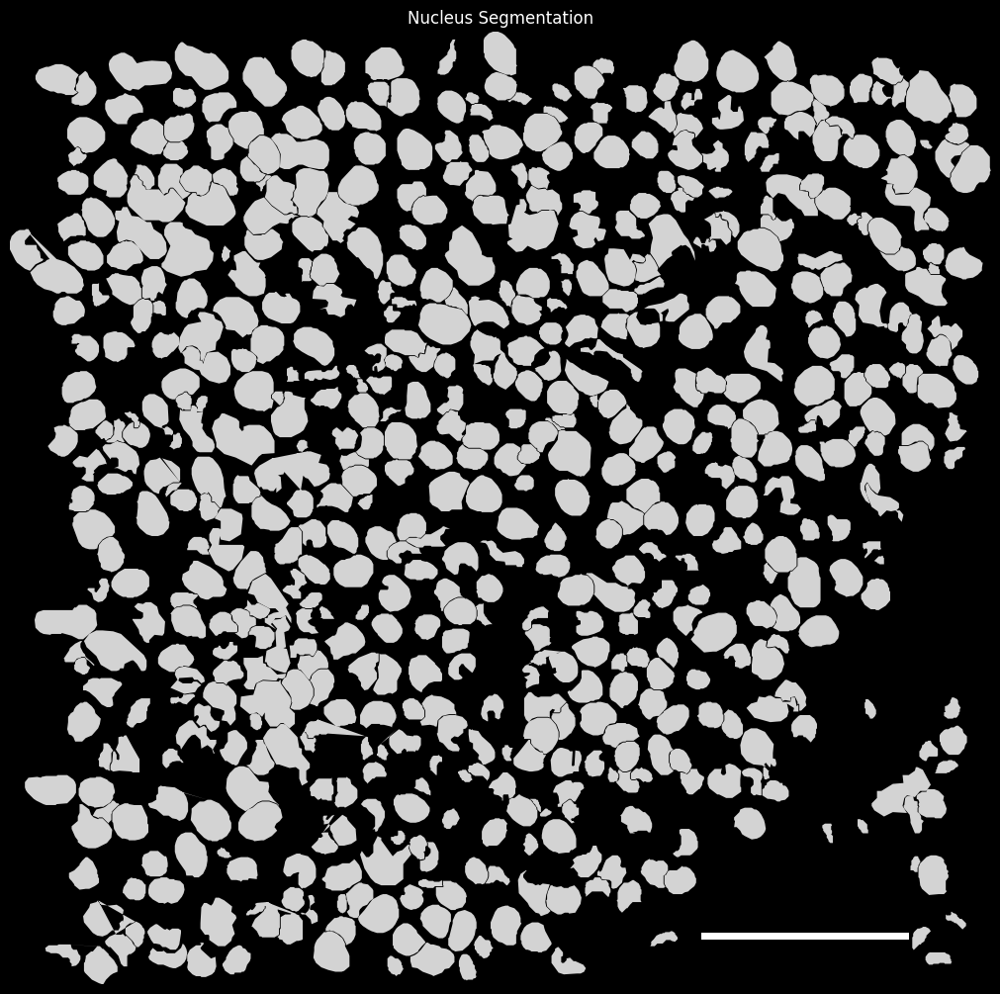

In [38]:
# Nucleus Segmentation
show_plot(
    sdata_cropped.pl.render_shapes("nucleus_boundaries", fill_alpha=1),
    figsize=(10, 10),
    colorbar=False,
    axis_off=True,
    title="Nucleus Segmentation",
    scalebar_bbox_transform=plt_transAxes,
    color="white",
    scalebar_bbox_to_anchor=(1.7, -0.05),
    scalebar_length_microns=50,
)

/home/ckmah/mambaforge/envs/synapse/lib/python3.11/site-packages/matplotlib_scalebar/scalebar.py:457: UserWarning: Drawing scalebar on axes with unequal aspect ratio; either call ax.set_aspect(1) or suppress the warning with rotation='horizontal-only'.
  warnings.warn(


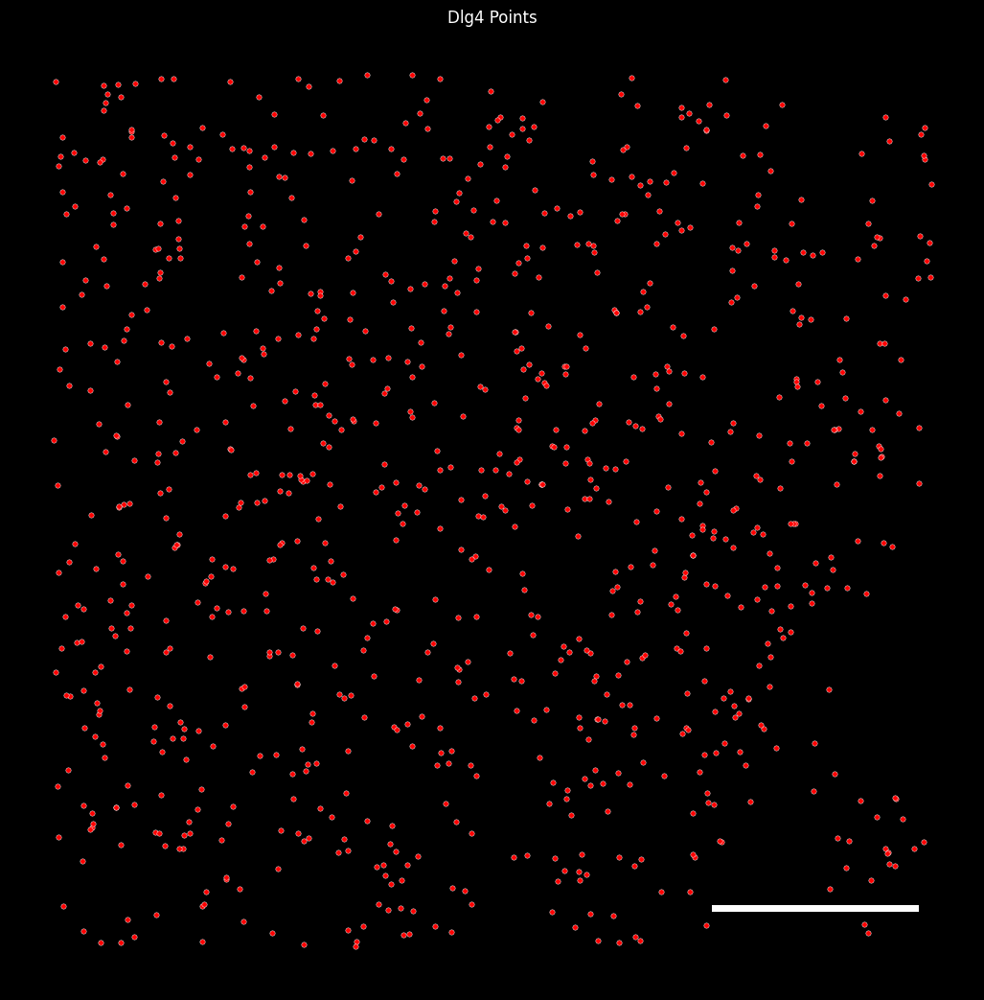

In [39]:
# Dlg4 Points Plot
gene = "Dlg4"
points = sdata_cropped["transcripts"].compute()

fig, ax = plt.subplots(figsize=(13, 13))
plot_gene_transcripts(
    gene,
    points,
    ax,
    scatter_sizes=[15],
    colors=["red"],
    scale=4.70588235,
    invert_y=True,
    title="",
)
scalebar = ScaleBar(
    dx=0.2125,  # 0.2125 microns per pixel
    units="µm",  # Micron units
    dimension="si-length",  # SI length dimension
    length_fraction=None,  # Use fixed value instead of fraction
    fixed_value=50,
    fixed_units="µm",
    color="white",
    box_color="black",
    box_alpha=0,
    width_fraction=0.007,  # Thinner bar
    scale_loc="bottom",  # Position of the scale text relative to the bar
    label_loc="top",
    bbox_to_anchor=(1.78, 0.05),
    bbox_transform=plt_transAxes,
    font_properties={"size": 8},
    location="lower right",  # Location of the scale bar
)
scalebar.scale_formatter = lambda value, unit: ""
ax.add_artist(scalebar)
fig.canvas.draw()
plt.title("Dlg4 Points")
plt.show()

INFO     Value for parameter 'color' appears to be a color, using it as such.                                      


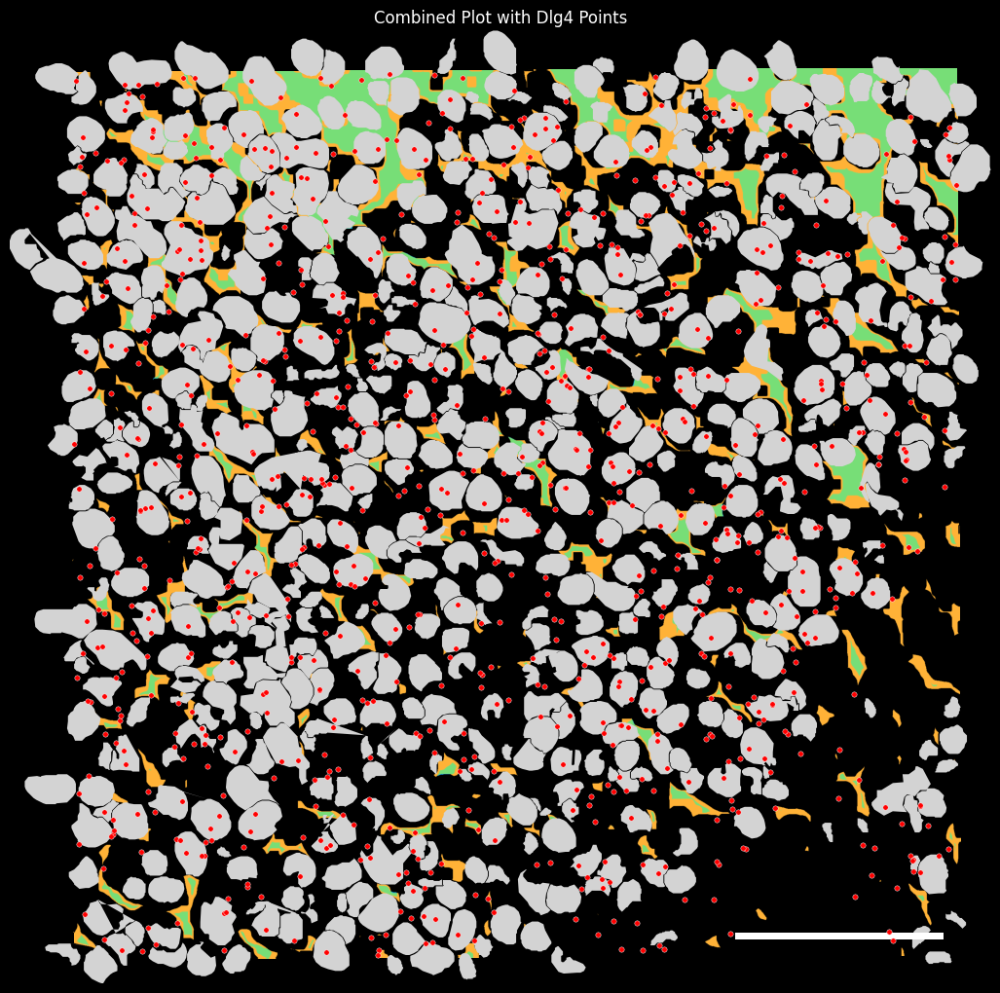

In [40]:
# Combined Plot: Pre and Postsynaptic Segmentation, Nucleus Segmentation, and Dlg4 Points
fig, ax = plt.subplots(figsize=(13, 13))
# Render the combined segmentation image and overlay nucleus boundaries.
sdata_cropped.pl.render_images("combined_if_black", scale="full").pl.render_shapes(
    "nucleus_boundaries", fill_alpha=1, color="lightgrey", outline_width=30
).pl.show(colorbar=False, ax=ax)

# Overlay Dlg4 points
plot_gene_transcripts(
    gene,
    points,
    ax,
    scatter_sizes=[15],
    colors=["red"],
    scale=4.70588235,
    invert_y=False,
)
scalebar = ScaleBar(
    dx=0.2125,  # 0.2125 microns per pixel
    units="µm",  # Micron units
    dimension="si-length",  # SI length dimension
    length_fraction=None,  # Use fixed value instead of fraction
    fixed_value=50,
    fixed_units="µm",
    color="white",
    box_color="black",
    box_alpha=0,
    width_fraction=0.007,  # Thinner bar
    scale_loc="bottom",  # Position of the scale text relative to the bar
    label_loc="top",
    bbox_to_anchor=(1.8, -0.05),
    bbox_transform=plt_transAxes,
    font_properties={"size": 8},
    location="lower right",  # Location of the scale bar
)
# Override the label text
scalebar.scale_formatter = lambda value, unit: ""
ax.add_artist(scalebar)
fig.canvas.draw()
plt.title("Combined Plot with Dlg4 Points")
plt.show()